# The Product Pricer Continued

#### Building a Base Model 

In [60]:
#package imports

import os 
import math 
import json
import random
from dotenv import load_dotenv
from huggingface_hub import login
import matplotlib.pyplot as plt
import numpy as np
import pickle 
from collections import Counter

#imports for traditional ml
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

#import for nlp
from sklearn.feature_extraction.text import CountVectorizer
from gensim.models import Word2Vec
from gensim.utils import simple_preprocess

#import for advanced ML 
from sklearn.svm import LinearSVR
from sklearn.ensemble import RandomForestRegressor

In [61]:
#import environment variables 
load_dotenv(override=True)
os.environ['OPENAI_API_KEY'] = os.getenv('OPENAI_API_KEY')
os.environ['ANTHROPIC_API_KEY'] = os.getenv('ANTHROPIC_API_KEY')
os.environ['HF_TOKEN'] = os.getenv('HF_TOKEN')

In [62]:
#log in to HuggingFace
hf_token = os.environ['HF_TOKEN']
login(hf_token, add_to_git_credential=True)

Note: Environment variable`HF_TOKEN` is set and is the current active token independently from the token you've just configured.


In [63]:
# Constants - used for printing to stdout in color

GREEN = "\033[92m"
YELLOW = "\033[93m"
RED = "\033[91m"
RESET = "\033[0m"
COLOR_MAP = {"red":RED, "orange": YELLOW, "green": GREEN}

In [64]:
# One more import after logging in
from items import Item

In [65]:
#Loading the pkl files
with open('train.pkl', 'rb') as file:
    train= pickle.load(file)

with open('test.pkl', 'rb') as file:
    test = pickle.load(file)

In [66]:
#let review so datapoint in train
print(train[0].prompt)
print(train[0].price)

How much does this cost to the nearest dollar?

Star Micronics USB Thermal Receipt Printer with Device and Mfi USB Ports, Auto-cutter, and Internal Power Supply - Gray (Renewed)
High-speed printing of 43 receipts per minute with easy to setup USB connection - just Plug and Print; USB serial number feature means the PC will detect the on its Windows platform using any USB port Includes PromoPRNT promotion printing service allowing you to automatically create printed promotions in addition to receipts Drop-In and Print clamshell design allows for fast and easy paper loading; patented De-Curl function always delivers a flat receipt futurePRNT Software allows you to customize receipts to keep customers coming back time and time again with professional graphics (logos, coupons), word-triggered advertising, and more The small footprint and embedded power supply saves precious counter space Brand Star Mic

Price is $207.00
207.0


In [67]:
#let review so datapoint in test
print(test[0].test_prompt())

How much does this cost to the nearest dollar?

Sena Bluetooth Headset and Intercom with Built-In FM Tuner for Scooters/Motorcycles with Universal Microphone Kit, Black, Single
SMH5 Bluetooth Headset & Intercom with built-in FM tuner for Scooters and Motorcycles with Universal Microphone Kit. Bluetooth 3.0 Crystal clear and natural sound quality Can be used while charging on road trips Individual volume control for each audio source Firmware upgradeable Brand Sena, Model Name Color Black, Form Factor On Ear, Connectivity Technology Wireless, Is Discontinued No, Dimensions 2.75 x 1.77 x 1.2 inches; 1.41 Ounces, model number Department Unisex-adult, Batteries Lithium Metal batteries required. (included), Available January 20

Price is $


In [68]:
#tester class that will evaluate any model against 250 items from the Test set
class Tester:

    def __init__(self, predictor, title=None, data=test, size=250):
        # Initialize the Tester with a prediction function, optional title, test data, and how many samples to test
        self.predictor = predictor
        self.data = data
        self.title = title or predictor.__name__.replace("_", " ").title()  # Use function name as title if not provided
        self.size = size  # Number of test data points to evaluate
        self.guesses = []  # Store model predictions
        self.truths = []   # Store actual (true) values
        self.errors = []   # Store absolute difference between prediction and truth
        self.sles = []     # Store squared log errors (for RMSLE calculation)
        self.colors = []   # Store color codes for error severity visualization

    def color_for(self, error, truth):
        # Decide color based on how big the error is (green = good, red = bad)
        if error < 40 or error / truth < 0.2:
            return "green"
        elif error < 80 or error / truth < 0.4:
            return "orange"
        else:
            return "red"
    
    def run_datapoint(self, i):
        # Run prediction and evaluation for a single data point at index i
        datapoint = self.data[i]
        guess = self.predictor(datapoint)         # Use model to make a prediction
        truth = datapoint.price                   # Actual price value
        error = abs(guess - truth)                # Absolute error
        log_error = math.log(truth + 1) - math.log(guess + 1)  # Log error to handle scale differences
        sle = log_error ** 2                      # Squared log error
        color = self.color_for(error, truth)      # call color_for method and assign a color based on error severity
        title = datapoint.title if len(datapoint.title) <= 40 else datapoint.title[:40] + "..."
        #append evething to the list above 
        self.guesses.append(guess)
        self.truths.append(truth)
        self.errors.append(error)
        self.sles.append(sle)
        self.colors.append(color)
        # Print formatted result with color
        print(f"{COLOR_MAP[color]}{i+1}: Guess: ${guess:,.2f} Truth: ${truth:,.2f} Error: ${error:,.2f} SLE: {sle:,.2f} Item: {title}{RESET}")

    def chart(self, title):
        # Create a scatter plot to visualize how close predictions are to actual values
        max_error = max(self.errors)
        plt.figure(figsize=(12, 8))
        max_val = max(max(self.truths), max(self.guesses)) #take max of whatever in truth and guess
        plt.plot([0, max_val], [0, max_val], color='deepskyblue', lw=2, alpha=0.6)  # Diagonal reference line
        plt.scatter(self.truths, self.guesses, s=3, c=self.colors)  # Scatter plot of actual vs predicted
        plt.xlabel('Ground Truth')
        plt.ylabel('Model Estimate')
        plt.xlim(0, max_val)
        plt.ylim(0, max_val)
        plt.title(title)
        plt.show()

    def report(self):
        # Summarize model performance with average error and RMSLE
        average_error = sum(self.errors) / self.size
        rmsle = math.sqrt(sum(self.sles) / self.size)  # Root Mean Squared Log Error
        hits = sum(1 for color in self.colors if color == "green")  # Count good predictions
        title = f"{self.title} Error=${average_error:,.2f} RMSLE={rmsle:,.2f} Hits={hits/self.size*100:.1f}%"
        self.chart(title)

    def run(self):
        # Run evaluation on all data points from run_datapoint method
        self.error = 0
        for i in range(self.size):
            self.run_datapoint(i)
        self.report()

    @classmethod
    def test(cls, function):
        # Class method to quickly test a given prediction function
        cls(function).run()


## Build a Basic Random Model -- Done for Fun!!!

- This model only makes random guesses of prices

In [12]:
def random_pricer(item):
    return random.randrange(1,1000)

1: Guess: $655.00 Truth: $140.49 Error: $514.51 SLE: 2.35 Item: Sena SMH5-FM-UNIV Bluetooth Headset and ...
2: Guess: $115.00 Truth: $347.99 Error: $232.99 SLE: 1.21 Item: ONINE Thruster Drop Steps Compatible wit...
3: Guess: $26.00 Truth: $228.00 Error: $202.00 SLE: 4.57 Item: Max Factory K-ON!: Mio Akiyama PVC Figur...
4: Guess: $760.00 Truth: $43.99 Error: $716.01 SLE: 8.00 Item: Gear Head RC 1/10 Scale Six Shooter LED ...
5: Guess: $282.00 Truth: $117.25 Error: $164.75 SLE: 0.76 Item: lenovo ThinkCentre M82 SFF Business Desk...
6: Guess: $251.00 Truth: $107.99 Error: $143.01 SLE: 0.70 Item: Retractable Cargo Cover Replacement for ...
7: Guess: $229.00 Truth: $52.99 Error: $176.01 SLE: 2.10 Item: Jiayouy 51Pieces Guitar Repairing Tool K...
8: Guess: $143.00 Truth: $49.99 Error: $93.01 SLE: 1.08 Item: Spec-D Tuning LF-CV094AMOEM-RS Honda Civ...
9: Guess: $755.00 Truth: $73.00 Error: $682.00 SLE: 5.40 Item: EX120-2 4257128 Fuel Tank Float - SINOCM...
10: Guess: $105.00 Truth: $249.00 

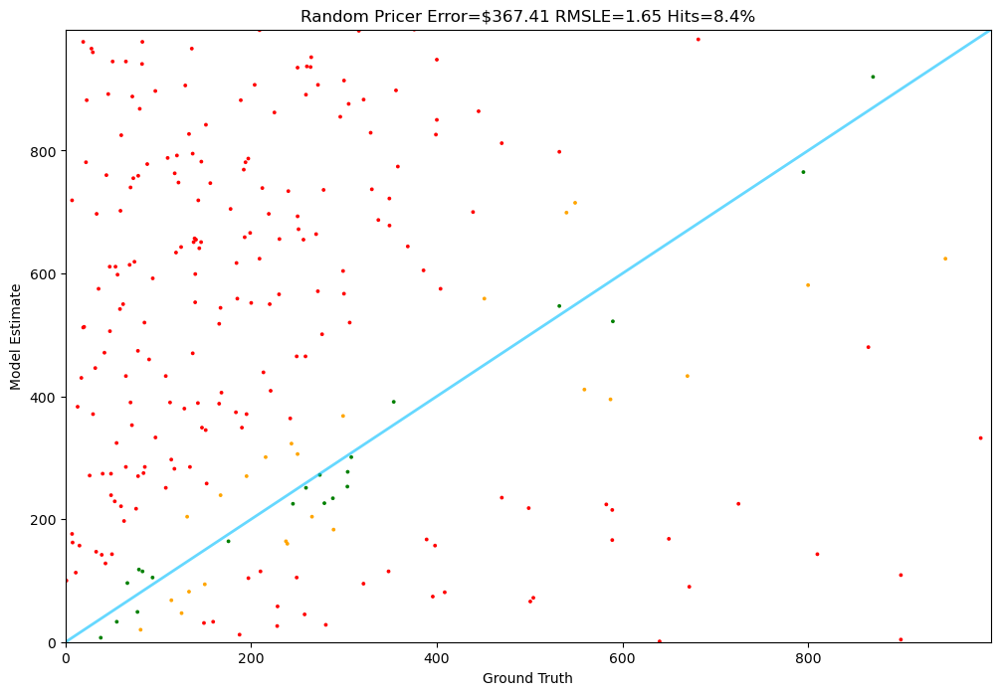

In [ ]:
#set the seed
random.seed(42)
Tester.test(random_pricer)

## Build a Basic Averaging Model -- Done for Fun!!!

In [14]:
training_price = [item.price for item in train]
training_average = sum(training_price)/len(training_price)

def constant_pricer(item):
    return training_average

1: Guess: $222.11 Truth: $140.49 Error: $81.62 SLE: 0.21 Item: Sena SMH5-FM-UNIV Bluetooth Headset and ...
2: Guess: $222.11 Truth: $347.99 Error: $125.88 SLE: 0.20 Item: ONINE Thruster Drop Steps Compatible wit...
3: Guess: $222.11 Truth: $228.00 Error: $5.89 SLE: 0.00 Item: Max Factory K-ON!: Mio Akiyama PVC Figur...
4: Guess: $222.11 Truth: $43.99 Error: $178.12 SLE: 2.56 Item: Gear Head RC 1/10 Scale Six Shooter LED ...
5: Guess: $222.11 Truth: $117.25 Error: $104.86 SLE: 0.40 Item: lenovo ThinkCentre M82 SFF Business Desk...
6: Guess: $222.11 Truth: $107.99 Error: $114.12 SLE: 0.51 Item: Retractable Cargo Cover Replacement for ...
7: Guess: $222.11 Truth: $52.99 Error: $169.12 SLE: 2.01 Item: Jiayouy 51Pieces Guitar Repairing Tool K...
8: Guess: $222.11 Truth: $49.99 Error: $172.12 SLE: 2.18 Item: Spec-D Tuning LF-CV094AMOEM-RS Honda Civ...
9: Guess: $222.11 Truth: $73.00 Error: $149.11 SLE: 1.22 Item: EX120-2 4257128 Fuel Tank Float - SINOCM...
10: Guess: $222.11 Truth: $249.00 E

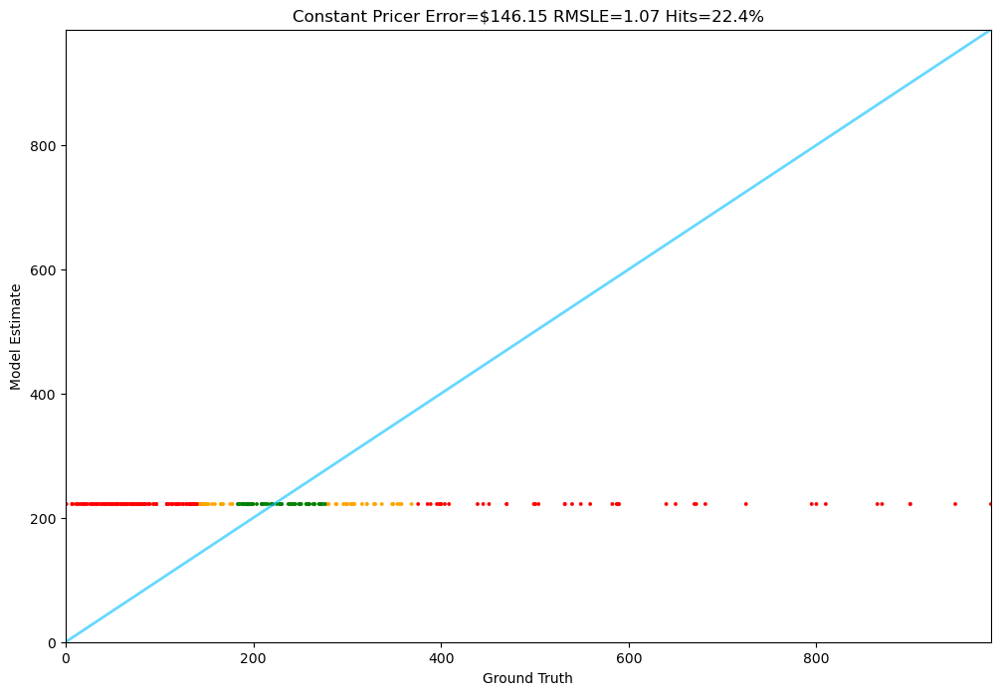

In [15]:
# Run our constant predictor
Tester.test(constant_pricer)

## Build Machine Learning Models 

- But first start with Feature Engineering

### Feature Engineering

In [69]:
train[0].details #this is actually string seems to be dict

'{"Brand": "Star Micronics", "Connectivity Technology": "USB", "Printing Technology": "Thermal", "Color": "Gray", "Recommended Uses For Product": "Office", "Model Name": "39472310", "Printer Output": "Monochrome", "Maximum Print Speed (Color)": "0.01 ppm", "Max Printspeed Monochrome": "28 ppm", "Operating System": "Windows"}'

In [70]:
#check dtype of details
type(train[0].details )

str

In [71]:
#we will convert this string to actual dict
for item in train:
    item.features = json.loads(item.details)
for item in test:
    item.features = json.loads(item.details)

In [72]:
#now check the data 
train[1].features.keys()

dict_keys(['Standing screen display size', 'Screen Resolution', 'Max Screen Resolution', 'Processor', 'RAM', 'Hard Drive', 'Graphics Coprocessor', 'Chipset Brand', 'Card Description', 'Graphics Card Ram Size', 'Wireless Type', 'Number of USB 2.0 Ports', 'Number of USB 3.0 Ports', 'Brand', 'Series', 'Item model number', 'Operating System', 'Item Weight', 'Product Dimensions', 'Item Dimensions  LxWxH', 'Color', 'Processor Brand', 'Number of Processors', 'Computer Memory Type', 'Hard Drive Interface', 'Best Sellers Rank', 'Date First Available', 'Specific Uses For Product', 'Personal computer design type', 'Memory Storage Capacity', 'Screen Size', 'Ram Memory Installed Size', 'Included Components', 'CPU Model'])

- We want to deal with "Item Weight" in this items features key:

dict_keys(['Standing screen display size', 'Screen Resolution', 'Max Screen Resolution', 'Processor', 'RAM', 'Hard Drive', 'Graphics Coprocessor', 'Chipset Brand', 'Card Description', 'Graphics Card Ram Size', 'Wireless Type', 'Number of USB 2.0 Ports', 'Number of USB 3.0 Ports', 'Brand', 'Series', 'Item model number', 'Operating System',--- 'Item Weight'---, 'Product Dimensions', 'Item Dimensions  LxWxH', 'Color', 'Processor Brand', 'Number of Processors', 'Computer Memory Type', 'Hard Drive Interface', 'Best Sellers Rank', 'Date First Available', 'Specific Uses For Product', 'Personal computer design type', 'Memory Storage Capacity', 'Screen Size', 'Ram Memory Installed Size', 'Included Components', 'CPU Model'])

In [73]:
#check str is converted to dict
type(train[0].features)  # see its dict now 

dict

In [75]:
#verify 20 features from training dataset 
feature_count = Counter()
for item in train:
    for f in item.features.keys():
        feature_count[f]+=1

feature_count.most_common(40)

[('Date First Available', 360235),
 ('Item Weight', 349916),
 ('Manufacturer', 349180),
 ('Brand', 339396),
 ('Best Sellers Rank', 329523),
 ('Item model number', 277513),
 ('Product Dimensions', 262037),
 ('Color', 181288),
 ('Is Discontinued By Manufacturer', 170497),
 ('Manufacturer Part Number', 146139),
 ('Material', 135372),
 ('Country of Origin', 120007),
 ('Style', 76385),
 ('Part Number', 74068),
 ('Special Feature', 73365),
 ('Batteries Required?', 72883),
 ('Package Dimensions', 72502),
 ('Item Dimensions LxWxH', 70909),
 ('Included Components', 66218),
 ('Model', 65255),
 ('Item Package Quantity', 57794),
 ('Size', 57265),
 ('Batteries Included?', 56208),
 ('OEM Part Number', 56192),
 ('Special Features', 52719),
 ('Exterior', 50723),
 ('Power Source', 49394),
 ('Vehicle Service Type', 49030),
 ('Voltage', 45805),
 ('Finish Type', 45318),
 ('Mounting Type', 37617),
 ('Model Name', 37097),
 ('Shape', 34181),
 ('Finish', 31305),
 ('Number of Items', 31304),
 ('Connectivity Te

- Out of above features we are only going to select that are most relevant to price. 
- Item Weight
- Best Sellers Rank
- Brand

In [76]:
def get_weight(item):
    weight_str = item.features.get('Item Weight')
    if weight_str:
        parts=weight_str.split(' ')
        amount=float(parts[0])
        unit=parts[1].lower()
        if unit=='pound':
            return amount
        elif unit=="ounces":
            return amount / 16
        elif unit=="grams":
            return amount / 453.592
        elif unit=="milligrams":
            return amount / 453592
        elif unit=="kilograms":
            return amount / 0.453592
        elif unit=="hundredths" and parts[2].lower()=="pounds":
            return amount / 100
        else:
            print(weight_str)
    return None

**For Feature Engineering I will take Average of weight, Average of Rank, Common Brands and also length of prompt since in last notebook I saw there is some relationship between prompt lenght and price.**

In [77]:
weights = [get_weight(t) for t in train]
weights = [w for w in weights if w]

14.53 pounds
2.88 pounds
90 pounds
2.2 pounds
4 pounds
1.01 pounds
13.5 pounds
12.4 pounds
1.1 pounds
6.17 pounds
4 Pounds
99.8 pounds
30.4 pounds
26.7 pounds
15.72 pounds
2.55 pounds
35.2 pounds
1.57 pounds
17 pounds
5.74 pounds
83.3 Pounds
8 Pounds
62.8 pounds
80 pounds
4.99 pounds
6 Pounds
13 pounds
14 Pounds
5.44 pounds
1.84 pounds
0.32 Pounds
10.6 pounds
10.21 pounds
550 pounds
33 Pounds
4 pounds
22.7 pounds
2 pounds
15 Pounds
9.48 pounds
44.3 pounds
45.4 pounds
31.6 pounds
13.72 pounds
14 pounds
7 pounds
26 pounds
3 pounds
1.2 pounds
8.38 pounds
0.02 Pounds
29 pounds
1 pounds
0.15 Pounds
0.4 Pounds
18 pounds
0.37 Pounds
4 Pounds
7 pounds
5.5 pounds
1.5 Pounds
23.9 pounds
0.39 Pounds
43.1 Pounds
30 pounds
10.82 pounds
8.2 Pounds
21.5 pounds
0.08 Pounds
6 Pounds
26.4 pounds
11.2 Pounds
73.7 pounds
4.85 pounds
2.76 pounds
1.1 pounds
5.19 pounds
0.35 Pounds
15 pounds
9.9 pounds
64.1 Pounds
45 pounds
11 pounds
19.26 pounds
3.55 pounds
1 pounds
12 pounds
13 pounds
25 pounds
2 pounds
2.

In [78]:
#find average weight
average_weight = sum(weights)/len(weights)
average_weight

1.5588437607491716

In [79]:
#find default item by weight 
def get_weight_with_default(item):
    weight = get_weight(item)
    return weight or average_weight

- Now , We want to deal with "Best Sellers Rank" in this items features key:

dict_keys(['Standing screen display size', 'Screen Resolution', 'Max Screen Resolution', 'Processor', 'RAM', 'Hard Drive', 'Graphics Coprocessor', 'Chipset Brand', 'Card Description', 'Graphics Card Ram Size', 'Wireless Type', 'Number of USB 2.0 Ports', 'Number of USB 3.0 Ports', 'Brand', 'Series', 'Item model number', 'Operating System',--- 'Item Weight'---, 'Product Dimensions', 'Item Dimensions  LxWxH', 'Color', 'Processor Brand', 'Number of Processors', 'Computer Memory Type', 'Hard Drive Interface', ---'Best Sellers Rank'---, 'Date First Available', 'Specific Uses For Product', 'Personal computer design type', 'Memory Storage Capacity', 'Screen Size', 'Ram Memory Installed Size', 'Included Components', 'CPU Model'])

In [80]:
#find best seller
def get_rank(item):
    rank_dict = item.features.get("Best Sellers Rank")
    if rank_dict:
        ranks=rank_dict.values()
        return sum(ranks)/len(ranks)
    return None    

In [83]:
#find average rank
ranks = [get_rank(t) for t in train]
ranks = [ r for r in ranks if r]
average_rank = sum(ranks)/len(ranks)
average_rank

384722.6513467478

In [84]:
#find default item by rank
def get_rank_with_default(item):
    rank = get_rank(item)
    return rank or average_rank

In [85]:
#get prompt length
def get_text_length(item):
    return len(item.test_prompt())

- Now , We want to deal with "Brand" in this items features key:

dict_keys(['Standing screen display size', 'Screen Resolution', 'Max Screen Resolution', 'Processor', 'RAM', 'Hard Drive', 'Graphics Coprocessor', 'Chipset Brand', 'Card Description', 'Graphics Card Ram Size', 'Wireless Type', 'Number of USB 2.0 Ports', 'Number of USB 3.0 Ports', ---'Brand'---, 'Series', 'Item model number', 'Operating System',--- 'Item Weight'---, 'Product Dimensions', 'Item Dimensions  LxWxH', 'Color', 'Processor Brand', 'Number of Processors', 'Computer Memory Type', 'Hard Drive Interface', ---'Best Sellers Rank'---, 'Date First Available', 'Specific Uses For Product', 'Personal computer design type', 'Memory Storage Capacity', 'Screen Size', 'Ram Memory Installed Size', 'Included Components', 'CPU Model'])

In [86]:
# investigate the brands
brands = Counter()
for t in train:
    brand = t.features.get("Brand")
    if brand:
        brands[brand]+=1

# Look at most common 40 brands

brands.most_common(40)

[('HP', 5458),
 ('Power Stop', 3573),
 ('Dell', 3246),
 ('Detroit Axle', 2626),
 ('Lenovo', 2419),
 ('Dorman', 2086),
 ('SAMSUNG', 1762),
 ('BUYAUTOPARTS!', 1709),
 ('ACDelco', 1589),
 ('ASUS', 1399),
 ('Evan Fischer', 1389),
 ('Sony', 1254),
 ('Canon', 1245),
 ('Callahan BRAKE PARTS', 1119),
 ('Kohler', 1110),
 ('R1 Concepts', 1075),
 ('CURT', 1052),
 ('WeatherTech', 1019),
 ('Rareelectrical', 964),
 ('Coverking', 934),
 ('Kingston Brass', 858),
 ('Garage-Pro', 853),
 ('Spectra Premium', 831),
 ('Moen', 823),
 ('Auto Dynasty', 816),
 ('DELTA FAUCET', 781),
 ('Apple', 781),
 ('K&N', 778),
 ('Cardone', 771),
 ('Generic', 767),
 ('APS', 760),
 ('EBC Brakes', 742),
 ('GM', 742),
 ('Walker', 711),
 ('Intel', 649),
 ('AKKON', 629),
 ('TYC', 622),
 ('SPEC-D TUNING', 611),
 ('Westin', 610),
 ('A-Premium', 603)]

In [87]:
#pick most common ones for laptops
TOP_ELECTRONICS_BRANDS = ["hp", "dell", "lenovo", "samsung", "asus", "sony", "canon", "apple", "intel"]
def is_top_electronics_brand(item):
    brand = item.features.get("Brand")
    return brand and brand.lower() in TOP_ELECTRONICS_BRANDS

In [88]:
#get the features out 
def get_features(item):
    return {
        "weight": get_weight_with_default(item),
        "rank": get_rank_with_default(item),
        "text_length": get_text_length(item),
        "is_top_electronics_brand": 1 if is_top_electronics_brand(item) else 0
    }

In [89]:
# review a features in a training item
get_features(train[0])

{'weight': 1.5588437607491716,
 'rank': 384722.6513467478,
 'text_length': 923,
 'is_top_electronics_brand': 0}

In [101]:
# a utility function to convert features into dataframe
def list_to_dataframe(items):
    features = [get_features(item) for item in items]
    df = pd.DataFrame(features)
    df['price'] = [item.price for item in items]
    return df

In [100]:
#Split train and test data 
train_df = list_to_dataframe(train)
test_df = list_to_dataframe(test[:250])

14.53 pounds
2.88 pounds
90 pounds
2.2 pounds
4 pounds
1.01 pounds
13.5 pounds
12.4 pounds
1.1 pounds
6.17 pounds
4 Pounds
99.8 pounds
30.4 pounds
26.7 pounds
15.72 pounds
2.55 pounds
35.2 pounds
1.57 pounds
17 pounds
5.74 pounds
83.3 Pounds
8 Pounds
62.8 pounds
80 pounds
4.99 pounds
6 Pounds
13 pounds
14 Pounds
5.44 pounds
1.84 pounds
0.32 Pounds
10.6 pounds
10.21 pounds
550 pounds
33 Pounds
4 pounds
22.7 pounds
2 pounds
15 Pounds
9.48 pounds
44.3 pounds
45.4 pounds
31.6 pounds
13.72 pounds
14 pounds
7 pounds
26 pounds
3 pounds
1.2 pounds
8.38 pounds
0.02 Pounds
29 pounds
1 pounds
0.15 Pounds
0.4 Pounds
18 pounds
0.37 Pounds
4 Pounds
7 pounds
5.5 pounds
1.5 Pounds
23.9 pounds
0.39 Pounds
43.1 Pounds
30 pounds
10.82 pounds
8.2 Pounds
21.5 pounds
0.08 Pounds
6 Pounds
26.4 pounds
11.2 Pounds
73.7 pounds
4.85 pounds
2.76 pounds
1.1 pounds
5.19 pounds
0.35 Pounds
15 pounds
9.9 pounds
64.1 Pounds
45 pounds
11 pounds
19.26 pounds
3.55 pounds
1 pounds
12 pounds
13 pounds
25 pounds
2 pounds
2.

## Linear Regression Model 

In [91]:
#set the seed
np.random.seed(42)

#seperate target and independent feature
feature_columns = ['weight', 'rank', 'text_length', 'is_top_electronics_brand']

X_train = train_df[feature_columns]
y_train = train_df['price']
X_test = test_df[feature_columns]
y_test = test_df['price']

#Instantiate the model
model = LinearRegression()

#fit the model
model.fit(X_train,y_train)

for feature, coef in zip(feature_columns,model.coef_):
    print(f"{feature}:{coef}")
print(f"Intercept: {model.intercept_}")

#predict the test set and evaluate
y_pred= model.predict(X_test)

#performance metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test,y_pred)

#print the metrics 
print(f"Mean Squared Error: {mse:.2f}")
print(f"R-Squared Score: {r2:.2f}")

weight:0.06273886078277689
rank:5.3738975542041814e-05
text_length:-0.01082399431475025
is_top_electronics_brand:193.02536657229862
Intercept: 200.449800379371
Mean Squared Error: 38407.62
R-Squared Score: 0.03


In [ ]:
#predict price for new item

def linear_regression_pricer(item):
    features = get_features(item)
    feature_df=pd.DataFrame([features])
    return model.predict(feature_df)[0]

1: Guess: $213.17 Truth: $140.49 Error: $72.68 SLE: 0.17 Item: Sena SMH5-FM-UNIV Bluetooth Headset and ...
60 pounds
2: Guess: $220.79 Truth: $347.99 Error: $127.20 SLE: 0.21 Item: ONINE Thruster Drop Steps Compatible wit...
1.17 pounds
3: Guess: $221.21 Truth: $228.00 Error: $6.79 SLE: 0.00 Item: Max Factory K-ON!: Mio Akiyama PVC Figur...
4: Guess: $213.37 Truth: $43.99 Error: $169.38 SLE: 2.44 Item: Gear Head RC 1/10 Scale Six Shooter LED ...
18.16 pounds
5: Guess: $386.02 Truth: $117.25 Error: $268.77 SLE: 1.41 Item: lenovo ThinkCentre M82 SFF Business Desk...
4.4 pounds
6: Guess: $209.99 Truth: $107.99 Error: $102.00 SLE: 0.44 Item: Retractable Cargo Cover Replacement for ...
2.49 pounds
7: Guess: $192.45 Truth: $52.99 Error: $139.46 SLE: 1.63 Item: Jiayouy 51Pieces Guitar Repairing Tool K...
3.54 pounds
8: Guess: $231.30 Truth: $49.99 Error: $181.31 SLE: 2.30 Item: Spec-D Tuning LF-CV094AMOEM-RS Honda Civ...
2.2 pounds
9: Guess: $212.38 Truth: $73.00 Error: $139.38 SLE: 1.12 Item

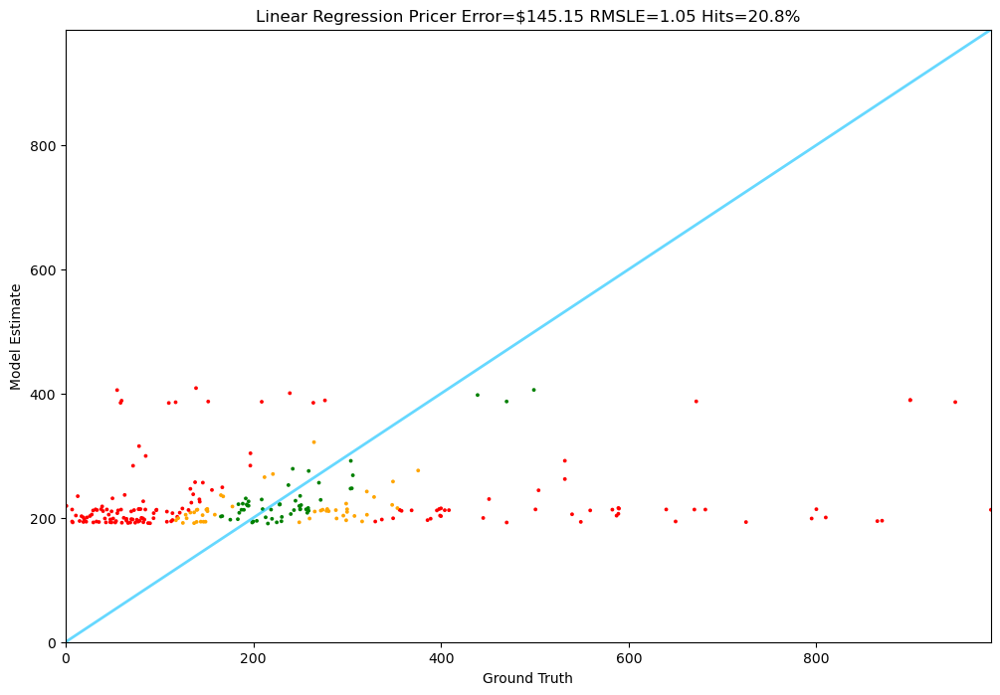

In [99]:
Tester.test(linear_regression_pricer)

**Model is performing quite bad so lets use BOW technique in NLP**

In [ ]:
# For the next few models, we prepare our documents and prices
# Note that we use the test prompt for the documents, otherwise we'll reveal the answer!!
# model should be exposed with answers in test dataset so we use only train

prices = np.array([float(item.price) for item in train])
documents = [item.test_prompt() for item  in train]

In [103]:
## Use Bag of words CountVectorizer

#set the seed
np.random.seed(42)

#initialize Vectorizer
vectorizer=CountVectorizer(max_features=1000, stop_words='english')

#fit transform the data
X = vectorizer.fit_transform(documents)

#instantiate the model 
regressor = LinearRegression()

#fit the model 
regressor.fit(X,prices)

LinearRegression()

In [106]:
# crete the function for the model
def bow_lr_pricer(item):
    x=vectorizer.transform([item.test_prompt()])
    return max(regressor.predict(x)[0],0)

1: Guess: $224.57 Truth: $140.49 Error: $84.08 SLE: 0.22 Item: Sena SMH5-FM-UNIV Bluetooth Headset and ...
2: Guess: $237.12 Truth: $347.99 Error: $110.87 SLE: 0.15 Item: ONINE Thruster Drop Steps Compatible wit...
3: Guess: $256.71 Truth: $228.00 Error: $28.71 SLE: 0.01 Item: Max Factory K-ON!: Mio Akiyama PVC Figur...
4: Guess: $128.37 Truth: $43.99 Error: $84.38 SLE: 1.12 Item: Gear Head RC 1/10 Scale Six Shooter LED ...
5: Guess: $344.27 Truth: $117.25 Error: $227.02 SLE: 1.15 Item: lenovo ThinkCentre M82 SFF Business Desk...
6: Guess: $187.42 Truth: $107.99 Error: $79.43 SLE: 0.30 Item: Retractable Cargo Cover Replacement for ...
7: Guess: $203.76 Truth: $52.99 Error: $150.77 SLE: 1.78 Item: Jiayouy 51Pieces Guitar Repairing Tool K...
8: Guess: $157.45 Truth: $49.99 Error: $107.46 SLE: 1.29 Item: Spec-D Tuning LF-CV094AMOEM-RS Honda Civ...
9: Guess: $230.45 Truth: $73.00 Error: $157.45 SLE: 1.30 Item: EX120-2 4257128 Fuel Tank Float - SINOCM...
10: Guess: $235.84 Truth: $249.00 Er

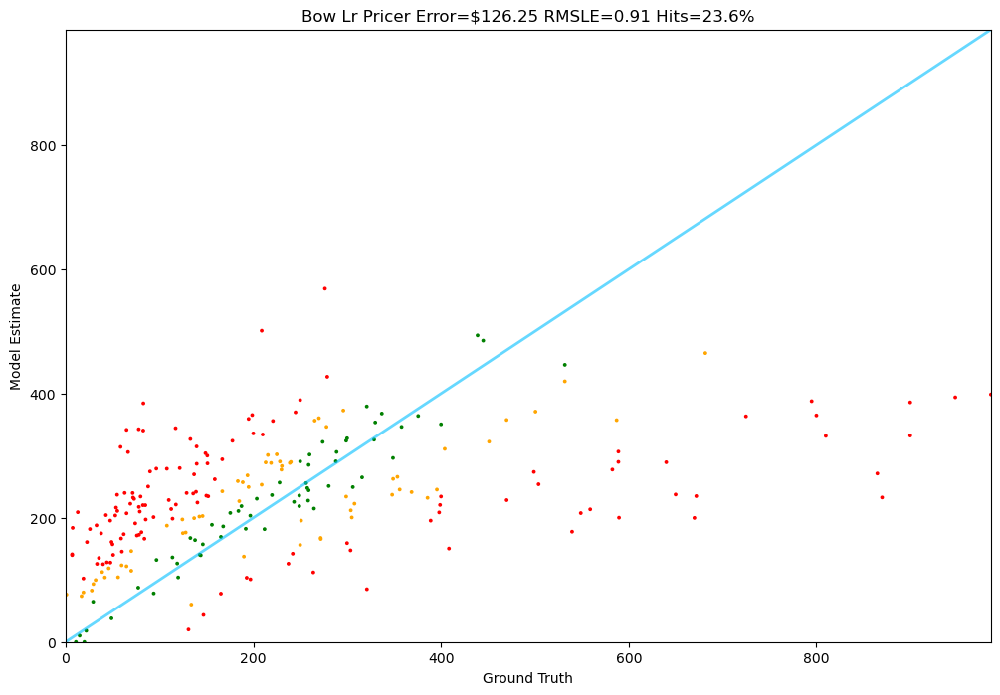

In [107]:
#test it 
Tester.test(bow_lr_pricer)

**Model is still performing bad But not as bad so maybe we use Word2Vec to improve performance**

In [108]:
#using gensim NLP library 

np.random.seed(42)

#preprocess the document
processed_docs=[simple_preprocess(doc) for doc in documents]

#initialize Word2Vec
w2v_model=Word2Vec(sentences=processed_docs, vector_size=400, window=5, min_count=1, workers=8)

In [109]:
# This step of averaging vectors across the document is a weakness in our approach

def document_vector(doc):
    doc_words=simple_preprocess(doc)
    word_vectors=[w2v_model.wv[word] for word in doc_words if word in w2v_model.wv]
    return np.mean(word_vectors, axis=0) if word_vectors else np.zeros(w2v_model.vector_size)

# Create feature matrix
X_w2v = np.array([document_vector(doc) for doc in documents])

In [110]:
#instantiate the model 
word2vec_lr_regressor = LinearRegression()

#fit the model
word2vec_lr_regressor.fit(X_w2v, prices)

LinearRegression()

In [111]:
def word2vec_lr_pricer(item):
    doc = item.test_prompt()
    doc_vector = document_vector(doc)
    return max(0, word2vec_lr_regressor.predict([doc_vector])[0])

1: Guess: $218.34 Truth: $140.49 Error: $77.85 SLE: 0.19 Item: Sena SMH5-FM-UNIV Bluetooth Headset and ...
2: Guess: $282.97 Truth: $347.99 Error: $65.02 SLE: 0.04 Item: ONINE Thruster Drop Steps Compatible wit...
3: Guess: $251.76 Truth: $228.00 Error: $23.76 SLE: 0.01 Item: Max Factory K-ON!: Mio Akiyama PVC Figur...
4: Guess: $167.46 Truth: $43.99 Error: $123.47 SLE: 1.74 Item: Gear Head RC 1/10 Scale Six Shooter LED ...
5: Guess: $382.12 Truth: $117.25 Error: $264.87 SLE: 1.38 Item: lenovo ThinkCentre M82 SFF Business Desk...
6: Guess: $149.56 Truth: $107.99 Error: $41.57 SLE: 0.10 Item: Retractable Cargo Cover Replacement for ...
7: Guess: $206.91 Truth: $52.99 Error: $153.92 SLE: 1.82 Item: Jiayouy 51Pieces Guitar Repairing Tool K...
8: Guess: $274.36 Truth: $49.99 Error: $224.37 SLE: 2.84 Item: Spec-D Tuning LF-CV094AMOEM-RS Honda Civ...
9: Guess: $157.74 Truth: $73.00 Error: $84.74 SLE: 0.58 Item: EX120-2 4257128 Fuel Tank Float - SINOCM...
10: Guess: $286.28 Truth: $249.00 Err

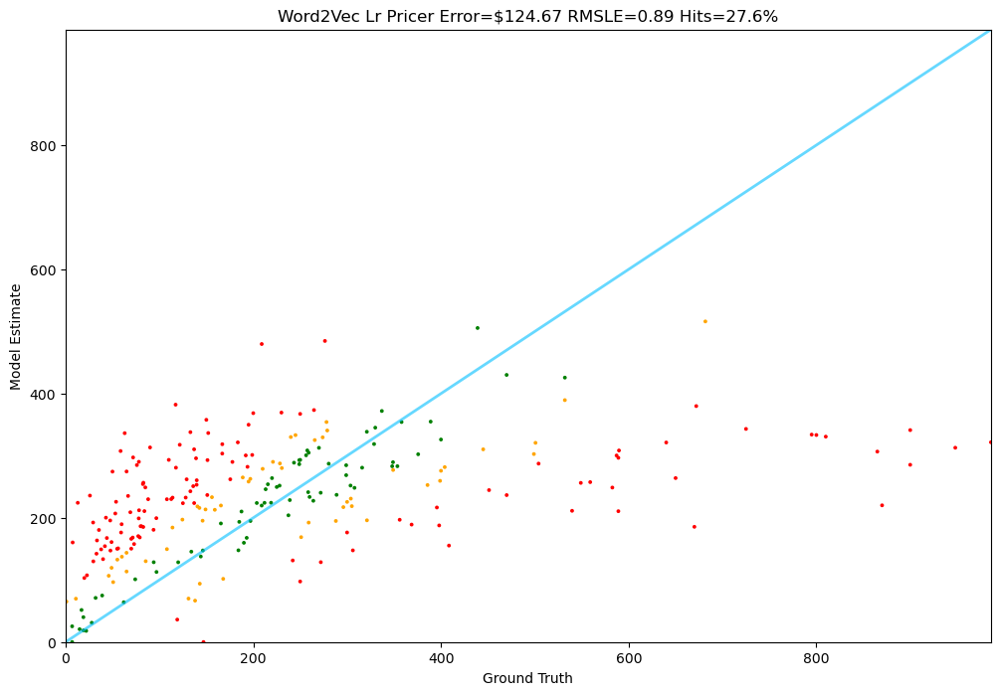

In [112]:
#test it 

Tester.test(word2vec_lr_pricer)

**Model is performing better but not considerably. We can Further try to improve performance by using SVM for Regressor**

## SVM: Support Vector Regressor Model 

In [113]:
# we will be using w2vec tokenizer only 
np.random.seed(42)

#instantiate the model 
svr_regressor = LinearSVR()

#fit the model
svr_regressor.fit(X_w2v, prices)

LinearSVR()

In [114]:
def svr_pricer(item):
    np.random.seed(42)
    doc = item.test_prompt()
    doc_vector = document_vector(doc)
    return max(float(svr_regressor.predict([doc_vector])[0]),0)


1: Guess: $181.45 Truth: $140.49 Error: $40.96 SLE: 0.06 Item: Sena SMH5-FM-UNIV Bluetooth Headset and ...
2: Guess: $235.35 Truth: $347.99 Error: $112.64 SLE: 0.15 Item: ONINE Thruster Drop Steps Compatible wit...
3: Guess: $188.73 Truth: $228.00 Error: $39.27 SLE: 0.04 Item: Max Factory K-ON!: Mio Akiyama PVC Figur...
4: Guess: $134.75 Truth: $43.99 Error: $90.76 SLE: 1.22 Item: Gear Head RC 1/10 Scale Six Shooter LED ...
5: Guess: $352.37 Truth: $117.25 Error: $235.12 SLE: 1.20 Item: lenovo ThinkCentre M82 SFF Business Desk...
6: Guess: $120.81 Truth: $107.99 Error: $12.82 SLE: 0.01 Item: Retractable Cargo Cover Replacement for ...
7: Guess: $152.30 Truth: $52.99 Error: $99.31 SLE: 1.09 Item: Jiayouy 51Pieces Guitar Repairing Tool K...
8: Guess: $207.31 Truth: $49.99 Error: $157.32 SLE: 1.98 Item: Spec-D Tuning LF-CV094AMOEM-RS Honda Civ...
9: Guess: $146.38 Truth: $73.00 Error: $73.38 SLE: 0.47 Item: EX120-2 4257128 Fuel Tank Float - SINOCM...
10: Guess: $195.52 Truth: $249.00 Erro

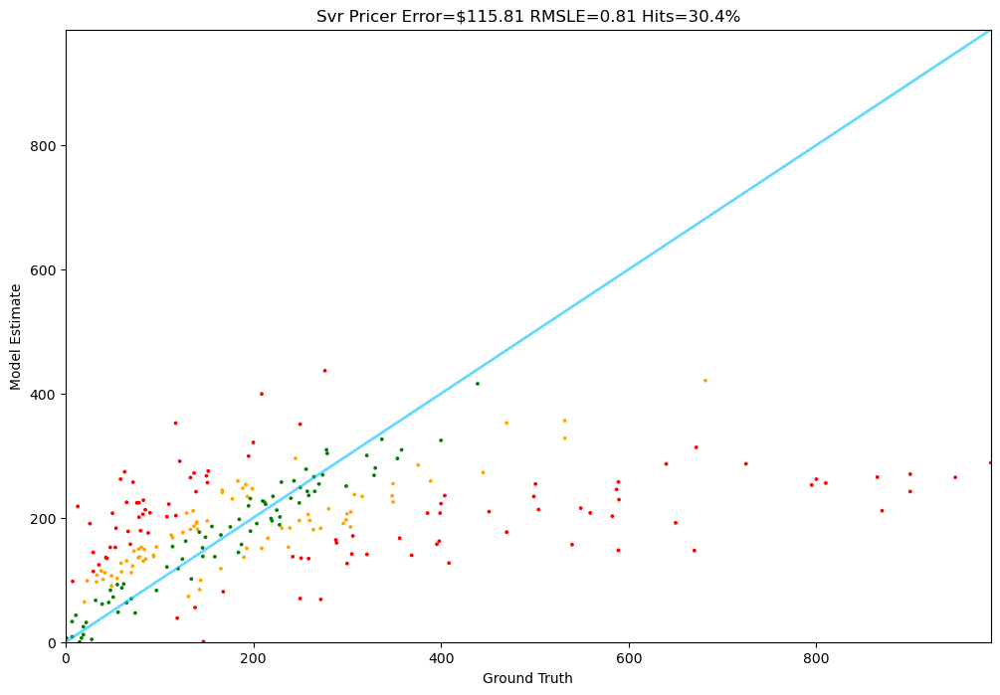

In [115]:
# test it again

Tester.test(svr_pricer)

**Model perform is improving. We can Further try to improve performance by using Ensemble model Random Forest Regression**

## Random Forest Regression

In [ ]:
#instantiate the model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1, verbose = True)

#fit the model 
rf_model.fit(X_w2v, prices)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


In [ ]:
def random_forest_pricer(item):
    doc = item.test_prompt()
    doc_vector = document_vector(doc)
    return max(0, rf_model.predict([doc_vector])[0])

In [ ]:
# test it again.
Tester.test(random_forest_pricer)